# Simulation of Hyper-Spectral Imagery (HSI) bands from Sentinel-2 bands

This notebook implements the simulation chain to simulate HSI bands starting from Sentinel-2 bands. The processing chain is outlined in the _IMAGIN-e: DataDesign Document_ document. 

The aim of this challenge is to create an AI-based application that will be deployed on board of the Internation Space Station (ISS), which will feature a HSI payload. In order to train your AI-based models, we simulate HSI imagery starting from Sentinel-2 imagery, which are spectrally overlapping, although Sentinel-2 features a Multi-Spectral payload rather than Hyper-Spectral, meaning a much lower spectral resolution. We also provide simulated HSI imagery starting from PRISMA imagery, which has a much higher spectral resolution than Sentinel-2, although a much lower spatial and temporal coverage. As part of this challenge, we simulated HSI imagery for approximately 490 locations covering the entire Earth's land cover. The pre-simulated images are available to download from direct link. Consult the data section on the challenge website for more information.

This notebook showcases how to simulate the data using [eo-learn](https://eo-learn.readthedocs.io/en/latest/index.html), a Python library specifically designed to deal with Earth Observation data. The data will be stored into EOPatches as numpy arrays and geopandas dataframes to facilitate processing operations. The output imagery is by default saved in the GeoTiff file format.

The simulation workflow can be summarised as follows:

 * download Sentinel-2 bands at HSI pixel size into an EOPatch;
 * resample spectral bands to HSI specifications;
 * simulate band-to-band misalignment;
 * simulate signal degradation due to Signal-to-Noise Ratio (SNR);
 * simulate signal degradation due to Module Transfer Function (MTF);
 * simulate L1C reflectances if required;
 * split the AOI into a smaller set of image patches;
 * save bands and masks for the image patches to generate an AI-ready dataset.

Content of the notebook is as follows:

0. [Requirements](#requirements)
1. [Data Download](#download)
2. [Conversion to Radiances](#radiances)
3. [Spectral resampling](#spectral)
4. [Band Misalignment](#misalignment)
5. [Noise Calculation](#snr)
6. [Simulate PSF Filtering](#psf)
7. [Alternative Noise and PSF filtering calculation](#alternative)
8. [Compute L1C](#l1c)
9. [Gridding](#gridding)
10. [Export to Tiff](#export)
11. [Create Workflow](#workflow)
10. [Core Dataset](#core-dataset)

To run the notebook, install the Python libraries listed in the provided `requirements.txt` file, for instance by running `pip install-r requirements.txt`.

In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
import os

import datetime
import numpy as np
import geopandas as gpd
import matplotlib.pyplot as plt
from scipy.interpolate import CubicSpline

from sentinelhub import (
    BBox,
    DataCollection,
    SHConfig,
    get_utm_crs,
    wgs84_to_utm,
)
from sentinelhub.exceptions import SHDeprecationWarning
from eolearn.core import (
    FeatureType,
    MapFeatureTask,
    linearly_connect_tasks,
    EOWorkflow,
    RemoveFeatureTask,
    EOExecutor,
)
from eolearn.io import SentinelHubInputTask
from s22hsi_utils import (
    get_extent,
    ExportGridToTiff,
    SpectralResamplingTask,
    AddMetadataTask,
    CalculateRadianceTask,
    CalculateReflectanceTask,
    GriddingTask,
    HSICalculationTask,
    AlternativeHSICalculationTask,
    BandMisalignmentTask,
)
from s22hsi_constants import (
    HSI_CW,
    HSI_PIX_SIZE,
    ProcessingLevels,
    BBOX_SIZE,
    S2_BANDS,
    S2_CW,
    HSI_CW,
)

In [3]:
# filter out some SHDeprecationWarnings
import warnings

warnings.filterwarnings("ignore", category=SHDeprecationWarning)

<a name="requirements"></a>
## 0. Requirements 

In order to download the training data through the provided APIs you would need to set-up an account for [Sentinel Hub](https://www.sentinel-hub.com/). 

If you don't have one already, create a [free trial account](https://apps.sentinel-hub.com/dashboard/), register an OAuth client from your dashboard by clicking on the "Create a new OAuth client" button, set the "Client grant type" to "Client Credentials" and save the secret value. Paste below the `client_id` and `secret_client_id` and you are ready to go. For more information on configuration of SH, please visit [this link](https://sentinelhub-py.readthedocs.io/en/latest/configure.html).

If you need to extend your trial account or have any issue using the service, please [contact support](info@sentinel-hub.com).

**If you are using the Euro Data Cube (EDC) resources**

The accounts have been already created and configured for you, and what you need is only to retrieve the SentinelHub credentials from your dashboard and paste them below (from your EDC dashboard click on EDC Sentinel Hub in the My API service subscriptions, then click on SHOW credential in API Access section).

In [4]:
sh_config = SHConfig()
sh_config.sh_client_id = "<your Sentinel Hub OAuth client ID>"
sh_config.sh_client_secret = "<your Sentinel Hub OAuth client secret>"

### Define processing level, AOI and time interval

In the following cells you have to specify the processing level, the AOI and the time interval for your simulated HSI bands.  

<div class="alert alert-block alert-info"> <b>NOTE</b> Define the processing level you want to simulate. </div> 

In [5]:
ProcessingLevels._member_names_

['L1B', 'L1C']

In [6]:
PROCESSING_LEVEL = ProcessingLevels.L1C
PROCESSING_LEVEL

<ProcessingLevels.L1C: 'L1C'>

<div class="alert alert-block alert-info"> <b>NOTE</b> Define bounding box. </div> 

Here the bounding box is computed given a swath width of approximately 46 km x 46 km. The user can input the centroid coordinates in WGS84 coordinate reference system, and the bounding box will be automatically created.

In [7]:
def get_utm_bbox(lat_centre: float, lon_centre: float):
    """Returns a bounding box of approximate size 46 km x 46 km given the centroid of the area-of-interest in WGS84"""

    east, north = wgs84_to_utm(lon_centre, lat_centre)

    east, north = 10 * int(east / 10), 10 * int(north / 10)
    crs = get_utm_crs(lon_centre, lat_centre)

    return BBox(
        bbox=(
            (east - BBOX_SIZE // 2, north - BBOX_SIZE // 2),
            (east + BBOX_SIZE // 2, north + BBOX_SIZE // 2),
        ),
        crs=crs,
    )

In [8]:
lat_centre, lon_centre = 53.72113, -77.50003

bbox = get_utm_bbox(lat_centre, lon_centre)

In [9]:
bbox

BBox(((312000.0, 5932350.0), (358080.0, 5978430.0)), crs=CRS('32618'))

<div class="alert alert-block alert-info"> <b>NOTE</b> Define time interval, max cloud coverage and interpolation method depending on your desired application. </div> 

In [10]:
time_interval = ("2019-10-12", "2019-10-12")
maxcc = 0.7  # The maximum allowed cloud coverage in percent
aux_request_args = {"processing": {"upsampling": "BICUBIC"}}

<a name="download"></a>
## 1. Data Download

Sentinel-2 bands covering the spectral range of HSI bands are downloaded. Spatial resampling is performed at this step by the Sentinel Hub service, which returns images of pixel size of **45 m**. 

In [11]:
additional_bands = [(FeatureType.DATA, name) for name in ["sunZenithAngles"]]
masks = [(FeatureType.MASK, "dataMask")]

In [12]:
input_task = SentinelHubInputTask(
    data_collection=DataCollection.SENTINEL2_L1C,
    resolution=HSI_PIX_SIZE,
    bands_feature=(FeatureType.DATA, "BANDS"),
    additional_data=masks + additional_bands,
    bands=S2_BANDS,
    aux_request_args=aux_request_args,
    config=sh_config,
    cache_folder="./temp_data/",
    time_difference=datetime.timedelta(minutes=180),
)

In [13]:
eop = input_task(bbox=bbox, time_interval=time_interval)

In [14]:
eop

EOPatch(
  data={
    BANDS: numpy.ndarray(shape=(1, 1024, 1024, 10), dtype=float32)
    sunZenithAngles: numpy.ndarray(shape=(1, 1024, 1024, 1), dtype=float32)
  }
  mask={
    dataMask: numpy.ndarray(shape=(1, 1024, 1024, 1), dtype=bool)
  }
  meta_info={
    size_x: 1024
    size_y: 1024
    time_difference: 10800.0
    time_interval: ('2019-10-12T00:00:00', '2019-10-12T23:59:59')
  }
  bbox=BBox(((312000.0, 5932350.0), (358080.0, 5978430.0)), crs=CRS('32618'))
  timestamp=[datetime.datetime(2019, 10, 12, 16, 28, 28)]
)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


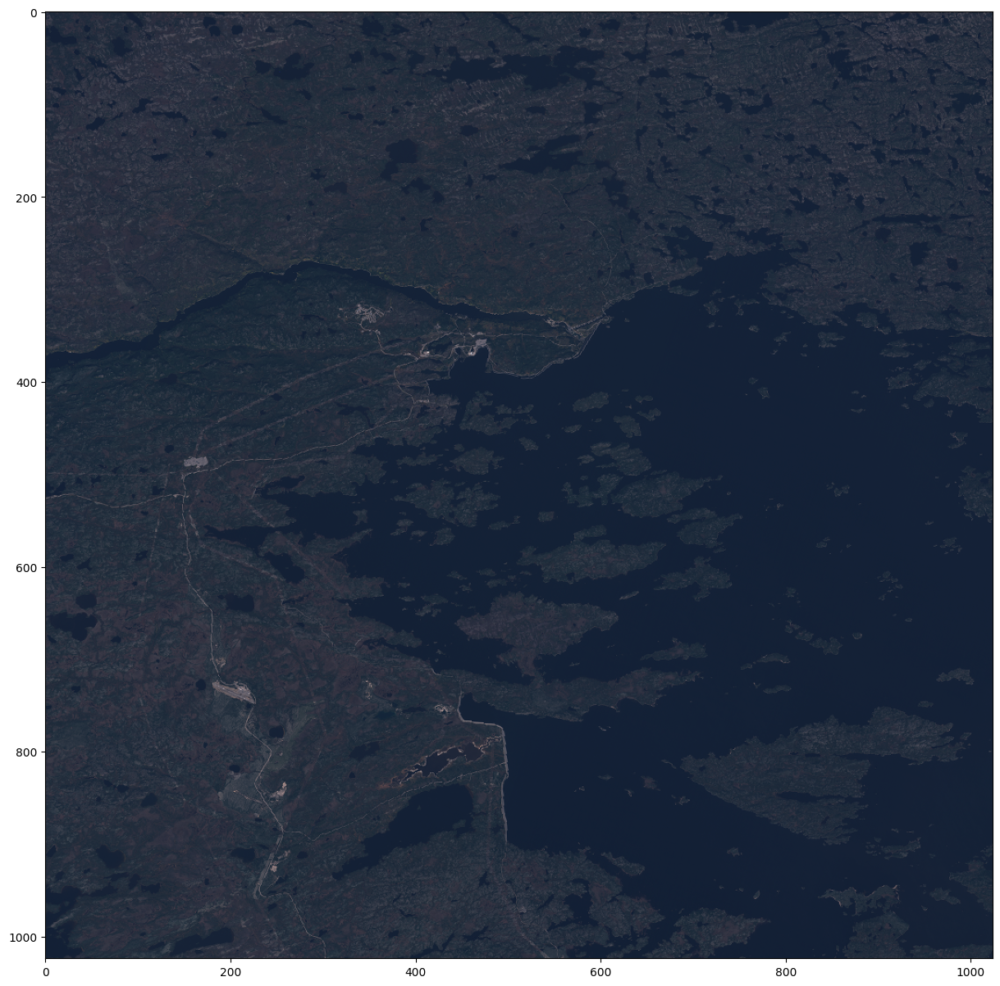

In [16]:
VIZ_FACTOR = 2.5

fig, axs = plt.subplots(figsize=(15, 15))
rgb_eop = eop.data["BANDS"][0][..., [3, 2, 1]]
axs.imshow(rgb_eop * VIZ_FACTOR);

<a name="radiances"></a>
## 2. Conversion to Radiances

Radiances are computed from the original reflectance values. The following processing steps, e.g. SNR simulation and PSF filtering, are valid if applied to radiances.

In [17]:
add_meta_task = AddMetadataTask(config=sh_config)

In [18]:
eop = add_meta_task(eop)

In [19]:
eop

EOPatch(
  data={
    BANDS: numpy.ndarray(shape=(1, 1024, 1024, 10), dtype=float32)
    sunZenithAngles: numpy.ndarray(shape=(1, 1024, 1024, 1), dtype=float32)
  }
  mask={
    dataMask: numpy.ndarray(shape=(1, 1024, 1024, 1), dtype=bool)
  }
  scalar={
    earth_sun_dist: numpy.ndarray(shape=(1, 1), dtype=float64)
    sol_irr_B01: numpy.ndarray(shape=(1, 1), dtype=float64)
    sol_irr_B02: numpy.ndarray(shape=(1, 1), dtype=float64)
    sol_irr_B03: numpy.ndarray(shape=(1, 1), dtype=float64)
    sol_irr_B04: numpy.ndarray(shape=(1, 1), dtype=float64)
    sol_irr_B05: numpy.ndarray(shape=(1, 1), dtype=float64)
    sol_irr_B06: numpy.ndarray(shape=(1, 1), dtype=float64)
    sol_irr_B07: numpy.ndarray(shape=(1, 1), dtype=float64)
    sol_irr_B08: numpy.ndarray(shape=(1, 1), dtype=float64)
    sol_irr_B09: numpy.ndarray(shape=(1, 1), dtype=float64)
    sol_irr_B8A: numpy.ndarray(shape=(1, 1), dtype=float64)
  }
  meta_info={
    size_x: 1024
    size_y: 1024
    time_difference: 10800.0
 

In [20]:
radiance_task = CalculateRadianceTask(
    (FeatureType.DATA, "BANDS"), (FeatureType.DATA, "BANDS-RAD")
)

In [21]:
eop = radiance_task(eop)

In [22]:
eop

EOPatch(
  data={
    BANDS: numpy.ndarray(shape=(1, 1024, 1024, 10), dtype=float32)
    BANDS-RAD: numpy.ndarray(shape=(1, 1024, 1024, 10), dtype=float64)
    sunZenithAngles: numpy.ndarray(shape=(1, 1024, 1024, 1), dtype=float32)
  }
  mask={
    dataMask: numpy.ndarray(shape=(1, 1024, 1024, 1), dtype=bool)
  }
  scalar={
    earth_sun_dist: numpy.ndarray(shape=(1, 1), dtype=float64)
    sol_irr_B01: numpy.ndarray(shape=(1, 1), dtype=float64)
    sol_irr_B02: numpy.ndarray(shape=(1, 1), dtype=float64)
    sol_irr_B03: numpy.ndarray(shape=(1, 1), dtype=float64)
    sol_irr_B04: numpy.ndarray(shape=(1, 1), dtype=float64)
    sol_irr_B05: numpy.ndarray(shape=(1, 1), dtype=float64)
    sol_irr_B06: numpy.ndarray(shape=(1, 1), dtype=float64)
    sol_irr_B07: numpy.ndarray(shape=(1, 1), dtype=float64)
    sol_irr_B08: numpy.ndarray(shape=(1, 1), dtype=float64)
    sol_irr_B09: numpy.ndarray(shape=(1, 1), dtype=float64)
    sol_irr_B8A: numpy.ndarray(shape=(1, 1), dtype=float64)
  }
  meta_

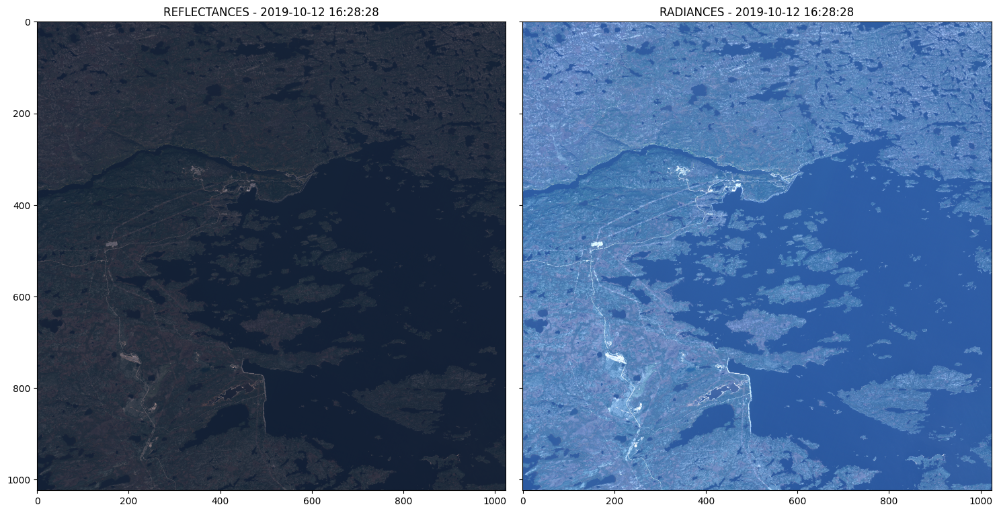

In [23]:
t_idx = 0
_, axes = plt.subplots(ncols=2, nrows=1, figsize=(15, 15), sharex=True, sharey=True)

axes[0].imshow(np.clip(VIZ_FACTOR * eop.data["BANDS"][t_idx][..., [3, 2, 1]], 0, 1))
axes[0].set_title(f"REFLECTANCES - {eop.timestamp[t_idx]}")

axes[1].imshow(
    np.clip(VIZ_FACTOR * eop.data["BANDS-RAD"][t_idx][..., [3, 2, 1]] / 100, 0, 1)
)
axes[1].set_title(f"RADIANCES - {eop.timestamp[t_idx]}")

plt.tight_layout()

<a name="spectral"></a>
## 3. Spectral resampling

An interpolation method based on spline interpolation is proposed for implementing the spectral resampling step. No Gaussian in this case smoothing is performed prior to resampling.

For each hyperspectral pixel Lp,l(λPRISMA_CW) at spatial position (p,l) in VNIR/SWIR Prisma cubes:

1) Compute the interpolation function fpl(λ)along the spectral axis λ as:
fp,l(λ) = spline_interp(x= λPRISMA_CW, y= Lp,l(λPRISMA_CW))

2) Evaluate the interpolation function fp,l(λ) at the Central Wavelengths λHYP_CW of the target hyperspectral sensor:
Lp,l(λ_HYP_CW) = fp,l(λ_HYP_CW)


Perform spectral resampling to HSI specifics.

In [24]:
spectral_resample_task = SpectralResamplingTask(
    (FeatureType.DATA, "BANDS-RAD", "BANDS-RAD-HSI"),
)

In [25]:
eop = spectral_resample_task(eop)

  0%|          | 0/1048576 [00:00<?, ?it/s]

In [26]:
eop

EOPatch(
  data={
    BANDS: numpy.ndarray(shape=(1, 1024, 1024, 10), dtype=float32)
    BANDS-RAD: numpy.ndarray(shape=(1, 1024, 1024, 10), dtype=float64)
    BANDS-RAD-HSI: numpy.ndarray(shape=(1, 1024, 1024, 50), dtype=float64)
    sunZenithAngles: numpy.ndarray(shape=(1, 1024, 1024, 1), dtype=float32)
  }
  mask={
    dataMask: numpy.ndarray(shape=(1, 1024, 1024, 1), dtype=bool)
  }
  scalar={
    earth_sun_dist: numpy.ndarray(shape=(1, 1), dtype=float64)
    sol_irr_B01: numpy.ndarray(shape=(1, 1), dtype=float64)
    sol_irr_B02: numpy.ndarray(shape=(1, 1), dtype=float64)
    sol_irr_B03: numpy.ndarray(shape=(1, 1), dtype=float64)
    sol_irr_B04: numpy.ndarray(shape=(1, 1), dtype=float64)
    sol_irr_B05: numpy.ndarray(shape=(1, 1), dtype=float64)
    sol_irr_B06: numpy.ndarray(shape=(1, 1), dtype=float64)
    sol_irr_B07: numpy.ndarray(shape=(1, 1), dtype=float64)
    sol_irr_B08: numpy.ndarray(shape=(1, 1), dtype=float64)
    sol_irr_B09: numpy.ndarray(shape=(1, 1), dtype=float

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


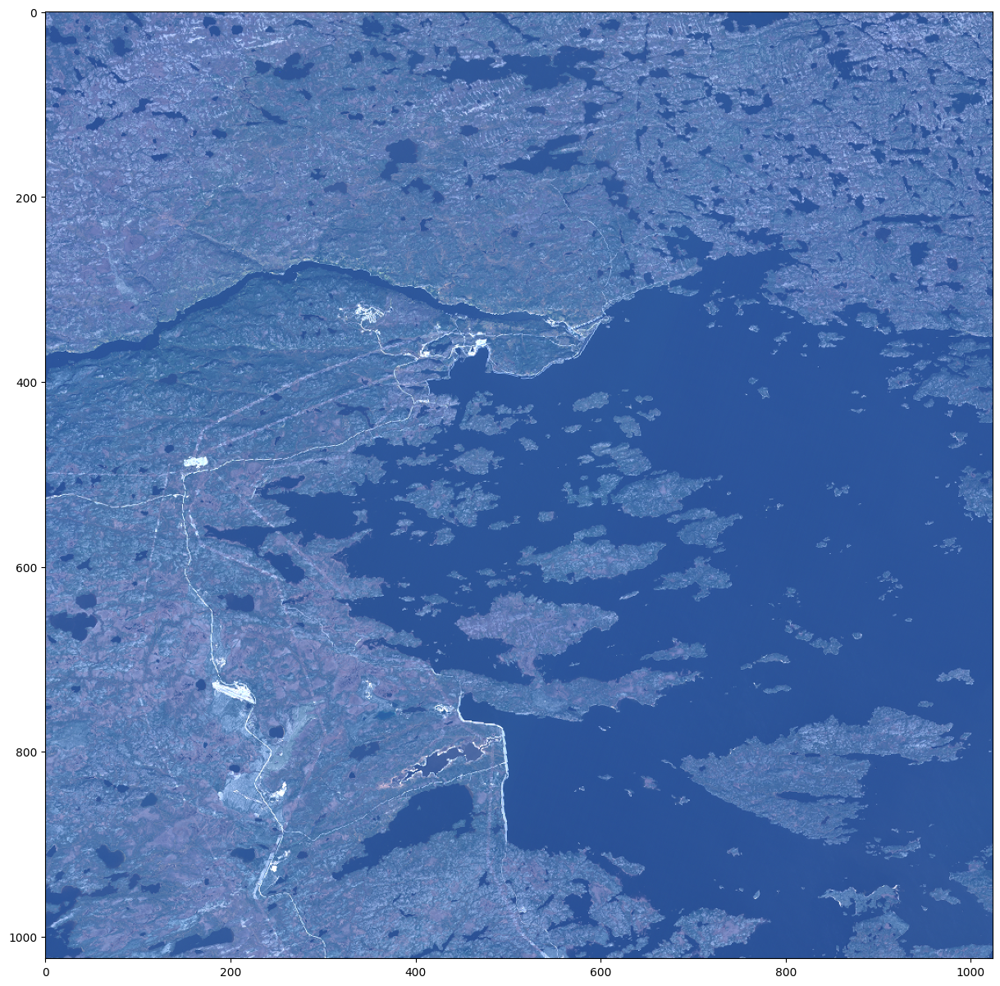

In [27]:
fig, axs = plt.subplots(figsize=(15, 15))
rgb_eop = eop.data["BANDS-RAD-HSI"][0][..., [22, 12, 5]]
axs.imshow(VIZ_FACTOR * rgb_eop / 100);

Text(0.5, 0, 'Wavelength (nm)')

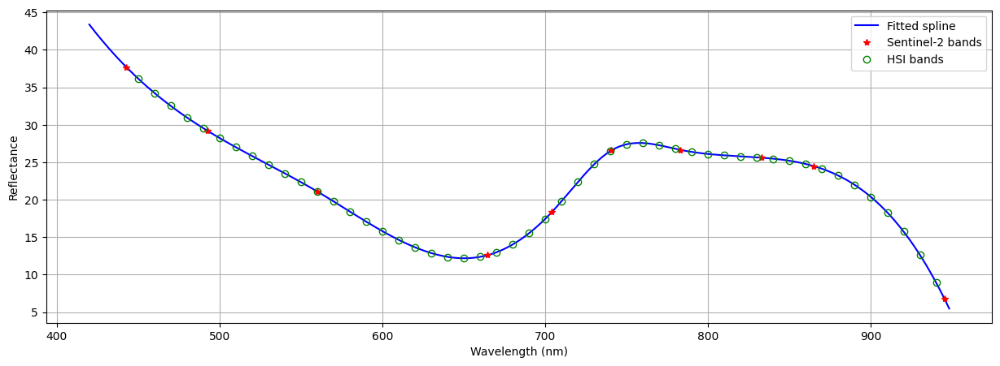

In [28]:
hidx, widx = 600, 600
x = S2_CW
y = eop.data["BANDS-RAD"][0][hidx, widx, :]
y_new = eop.data["BANDS-RAD-HSI"][0][hidx, widx, :]
spline = CubicSpline(x, y)

fig, ax = plt.subplots(figsize=(15, 5))
ax.plot(
    np.arange(420, 950, 2),
    spline(np.arange(420, 950, 2)),
    "-b",
    label="Fitted spline",
)
ax.plot(x, y, "*r", label="Sentinel-2 bands")
ax.plot(HSI_CW, y_new, "og", markerfacecolor="none", label="HSI bands")
ax.grid()
ax.legend()
ax.set_ylabel("Reflectance")
ax.set_xlabel("Wavelength (nm)")

Check pixel size.

In [29]:
_, height, width, _ = eop.data["BANDS-RAD-HSI"].shape

In [30]:
(eop.bbox.upper_right[1] - eop.bbox.lower_left[1]) / height

45.0

In [31]:
(eop.bbox.upper_right[0] - eop.bbox.lower_left[0]) / width

45.0

<a name="misalignment"></a>
## 4. Band-to-Band Misalignment 

The task simulates a band-to-band misalignment noise, adding a relative, constant, and increasing shift to all bands starting from the reference band `BAND_450`, with an additional random component distributed as a normal Gaussian of N(0, 0.04). The total misalignment from `BAND_450` to `BAND_940` is of 10 pixels, resulting in a constant shift of 0.204 pixels between spectral bands.

In [32]:
misalignment_task = BandMisalignmentTask(
    (FeatureType.DATA, "BANDS-RAD-HSI", "BANDS-RAD-HSI-MIS")
)

In [33]:
eop = misalignment_task(eop)

eop

EOPatch(
  data={
    BANDS: numpy.ndarray(shape=(1, 1024, 1024, 10), dtype=float32)
    BANDS-RAD: numpy.ndarray(shape=(1, 1024, 1024, 10), dtype=float64)
    BANDS-RAD-HSI: numpy.ndarray(shape=(1, 1024, 1024, 50), dtype=float64)
    BANDS-RAD-HSI-MIS: numpy.ndarray(shape=(1, 1024, 1024, 50), dtype=float64)
    sunZenithAngles: numpy.ndarray(shape=(1, 1024, 1024, 1), dtype=float32)
  }
  mask={
    dataMask: numpy.ndarray(shape=(1, 1024, 1024, 1), dtype=bool)
  }
  scalar={
    earth_sun_dist: numpy.ndarray(shape=(1, 1), dtype=float64)
    sol_irr_B01: numpy.ndarray(shape=(1, 1), dtype=float64)
    sol_irr_B02: numpy.ndarray(shape=(1, 1), dtype=float64)
    sol_irr_B03: numpy.ndarray(shape=(1, 1), dtype=float64)
    sol_irr_B04: numpy.ndarray(shape=(1, 1), dtype=float64)
    sol_irr_B05: numpy.ndarray(shape=(1, 1), dtype=float64)
    sol_irr_B06: numpy.ndarray(shape=(1, 1), dtype=float64)
    sol_irr_B07: numpy.ndarray(shape=(1, 1), dtype=float64)
    sol_irr_B08: numpy.ndarray(shape=

In [34]:
eop.meta_info["Shifts"]

{0: [(0.0, 0.0),
  (0.014023648098943933, 0.24909230345423916),
  (0.00797774052532988, 0.4929260942782623),
  (0.0008690230085952998, 0.6964689276624783),
  (0.06743453288026276, 0.8553807994071161),
  (0.09540509708930281, 1.0914722067674298),
  (0.09699631784097568, 1.2451913843336564),
  (0.09911899106214661, 1.4547222150532813),
  (0.08154484040691719, 1.6633397031067207),
  (0.0785575412589768, 1.8708016518404387),
  (0.05187960517000037, 2.061595906133662),
  (0.07659044316214414, 2.2912138152710657),
  (0.07594079595754823, 2.4954414399250737),
  (0.07600810285883022, 2.7016389346786287),
  (0.07658359993039111, 2.9210148701880194),
  (0.07972107976866773, 3.2193429833081897),
  (0.06841531292306857, 3.43472151619466),
  (0.0673853798481059, 3.6340594211644173),
  (0.05137923456595028, 3.853294906429658),
  (0.0521598210173108, 4.004428802213183),
  (0.04156639014086107, 4.179754085550654),
  (0.042709316596321815, 4.378720495521625),
  (0.04855964121994553, 4.5801380341327675)

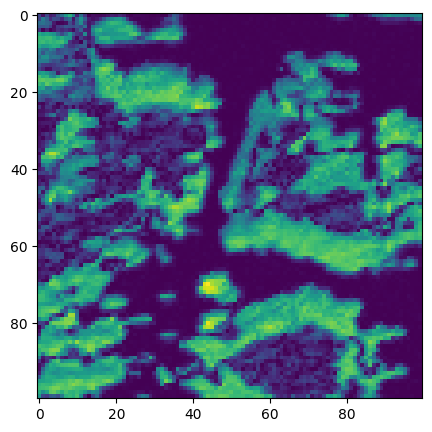

In [35]:
band_idx = -1

fig, axs = plt.subplots(figsize=(5, 5))
axs.imshow(
    np.abs(
        eop.data["BANDS-RAD-HSI"][0][400:500, 400:500, band_idx]
        - eop.data["BANDS-RAD-HSI-MIS"][0][400:500, 400:500, band_idx]
    )
);

In [36]:
remove_feature_task1 = RemoveFeatureTask(
    [
        (FeatureType.DATA, "BANDS"),
        (FeatureType.DATA, "BANDS-RAD"),
        (FeatureType.DATA, "BANDS-RAD-HSI"),
    ]
)

In [37]:
eop = remove_feature_task1(eop)

In [38]:
eop

EOPatch(
  data={
    BANDS-RAD-HSI-MIS: numpy.ndarray(shape=(1, 1024, 1024, 50), dtype=float64)
    sunZenithAngles: numpy.ndarray(shape=(1, 1024, 1024, 1), dtype=float32)
  }
  mask={
    dataMask: numpy.ndarray(shape=(1, 1024, 1024, 1), dtype=bool)
  }
  scalar={
    earth_sun_dist: numpy.ndarray(shape=(1, 1), dtype=float64)
    sol_irr_B01: numpy.ndarray(shape=(1, 1), dtype=float64)
    sol_irr_B02: numpy.ndarray(shape=(1, 1), dtype=float64)
    sol_irr_B03: numpy.ndarray(shape=(1, 1), dtype=float64)
    sol_irr_B04: numpy.ndarray(shape=(1, 1), dtype=float64)
    sol_irr_B05: numpy.ndarray(shape=(1, 1), dtype=float64)
    sol_irr_B06: numpy.ndarray(shape=(1, 1), dtype=float64)
    sol_irr_B07: numpy.ndarray(shape=(1, 1), dtype=float64)
    sol_irr_B08: numpy.ndarray(shape=(1, 1), dtype=float64)
    sol_irr_B09: numpy.ndarray(shape=(1, 1), dtype=float64)
    sol_irr_B8A: numpy.ndarray(shape=(1, 1), dtype=float64)
  }
  meta_info={
    Shifts: <class 'dict'>, length=1
    size_x: 102

<a name="snr"></a>
## 5. SNR 

This step simulates noise according to the signal-toNoise (SNR) specifications of the hardware.

A compiled executable will perform the SNR and PSF calculation. 

Executables for the following Operating Systems (OSs) have been compiled:

 * Unix, `hsi-s2_unix.bin`
 * Windows, `hsi-s2_win.bin`
 * MacOS, `hsi-s2_osx-arm64.bin` for ARM chips, `hsi-s2_osx-x86_64.bin` for Intel chips
 
Download the suitable binary for your OS from this [link](https://cloud.sinergise.com/s/bXLaiGXLj8M4rte). 

Once downloaded, allow the operating system to run the file and make it executable (e.g. `chmod a+x hsi-s2_unix.bin`). Then set the path to the executable in the cell below.

In [39]:
EXEC_PATH = "executables/hsi-s2_unix.bin"

In [40]:
snr_task = HSICalculationTask(
    input_feature=(FeatureType.DATA, "BANDS-RAD-HSI-MIS"),
    output_feature=(FeatureType.DATA, "BANDS-RAD-HSI-MIS-SNR"),
    executable=EXEC_PATH,
    calculation="SNR",
)

In [41]:
eop = snr_task(eop);

/tmp/onefile_54020_1676378341_959463/hsi-s2_calculations.py:100: RuntimeWarning: invalid value encountered in sqrt


In [42]:
eop

EOPatch(
  data={
    BANDS-RAD-HSI-MIS: numpy.ndarray(shape=(1, 1024, 1024, 50), dtype=float64)
    BANDS-RAD-HSI-MIS-SNR: numpy.ndarray(shape=(1, 1024, 1024, 50), dtype=float64)
    sunZenithAngles: numpy.ndarray(shape=(1, 1024, 1024, 1), dtype=float32)
  }
  mask={
    dataMask: numpy.ndarray(shape=(1, 1024, 1024, 1), dtype=bool)
  }
  scalar={
    earth_sun_dist: numpy.ndarray(shape=(1, 1), dtype=float64)
    sol_irr_B01: numpy.ndarray(shape=(1, 1), dtype=float64)
    sol_irr_B02: numpy.ndarray(shape=(1, 1), dtype=float64)
    sol_irr_B03: numpy.ndarray(shape=(1, 1), dtype=float64)
    sol_irr_B04: numpy.ndarray(shape=(1, 1), dtype=float64)
    sol_irr_B05: numpy.ndarray(shape=(1, 1), dtype=float64)
    sol_irr_B06: numpy.ndarray(shape=(1, 1), dtype=float64)
    sol_irr_B07: numpy.ndarray(shape=(1, 1), dtype=float64)
    sol_irr_B08: numpy.ndarray(shape=(1, 1), dtype=float64)
    sol_irr_B09: numpy.ndarray(shape=(1, 1), dtype=float64)
    sol_irr_B8A: numpy.ndarray(shape=(1, 1), dt

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


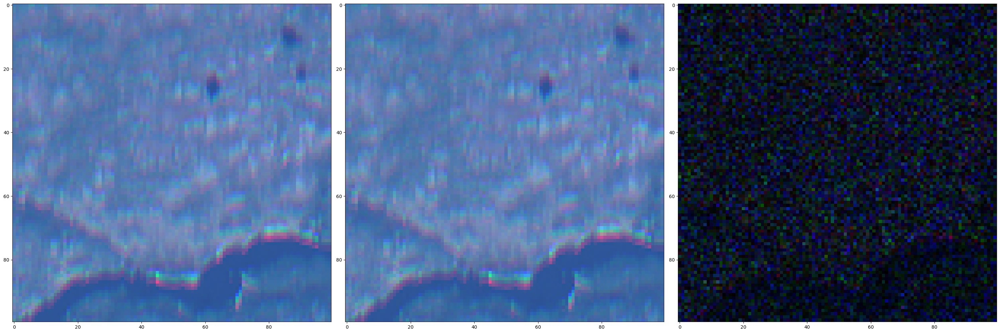

In [43]:
fig, axs = plt.subplots(figsize=(30, 10), ncols=3)
eop_mis = eop.data["BANDS-RAD-HSI-MIS"][0][200:300, 200:300, [22, 12, 5]]
eop_snr = eop.data["BANDS-RAD-HSI-MIS-SNR"][0][200:300, 200:300, [22, 12, 5]]
axs[0].imshow(eop_mis * VIZ_FACTOR / 100)
axs[1].imshow(eop_snr * VIZ_FACTOR / 100)
axs[2].imshow(np.abs(eop_mis - eop_snr))
plt.tight_layout()

<a name="psf"></a>
## 6. Simulate Point Spread Function (PSF) Filtering 

Step that simulates loss of signal due to limited bandwidth of the Module Transfer Function (MTF), which is equivalent to simulate the Point Spread Function (PSF) for the optics.

The same executable as for SNR is used. If you have not downloaded it already, do so for your OS from this [link](https://cloud.sinergise.com/s/bXLaiGXLj8M4rte). Once downloaded, allow the operating system to run the file and make it executable (e.g. `chmod a+x hsi-s2_unix.bin`). Then set the path to the executable in the cell below.

In [44]:
psf_filter_task = HSICalculationTask(
    input_feature=(FeatureType.DATA, "BANDS-RAD-HSI-MIS-SNR"),
    output_feature=(FeatureType.DATA, "BANDS-RAD-HSI-MIS-PSF"),
    executable=EXEC_PATH,
    calculation="PSF",
)

In [45]:
eop = psf_filter_task.execute(eop)

# check result:
eop

EOPatch(
  data={
    BANDS-RAD-HSI-MIS: numpy.ndarray(shape=(1, 1024, 1024, 50), dtype=float64)
    BANDS-RAD-HSI-MIS-PSF: numpy.ndarray(shape=(1, 1024, 1024, 50), dtype=float64)
    BANDS-RAD-HSI-MIS-SNR: numpy.ndarray(shape=(1, 1024, 1024, 50), dtype=float64)
    sunZenithAngles: numpy.ndarray(shape=(1, 1024, 1024, 1), dtype=float32)
  }
  mask={
    dataMask: numpy.ndarray(shape=(1, 1024, 1024, 1), dtype=bool)
  }
  scalar={
    earth_sun_dist: numpy.ndarray(shape=(1, 1), dtype=float64)
    sol_irr_B01: numpy.ndarray(shape=(1, 1), dtype=float64)
    sol_irr_B02: numpy.ndarray(shape=(1, 1), dtype=float64)
    sol_irr_B03: numpy.ndarray(shape=(1, 1), dtype=float64)
    sol_irr_B04: numpy.ndarray(shape=(1, 1), dtype=float64)
    sol_irr_B05: numpy.ndarray(shape=(1, 1), dtype=float64)
    sol_irr_B06: numpy.ndarray(shape=(1, 1), dtype=float64)
    sol_irr_B07: numpy.ndarray(shape=(1, 1), dtype=float64)
    sol_irr_B08: numpy.ndarray(shape=(1, 1), dtype=float64)
    sol_irr_B09: numpy.n

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


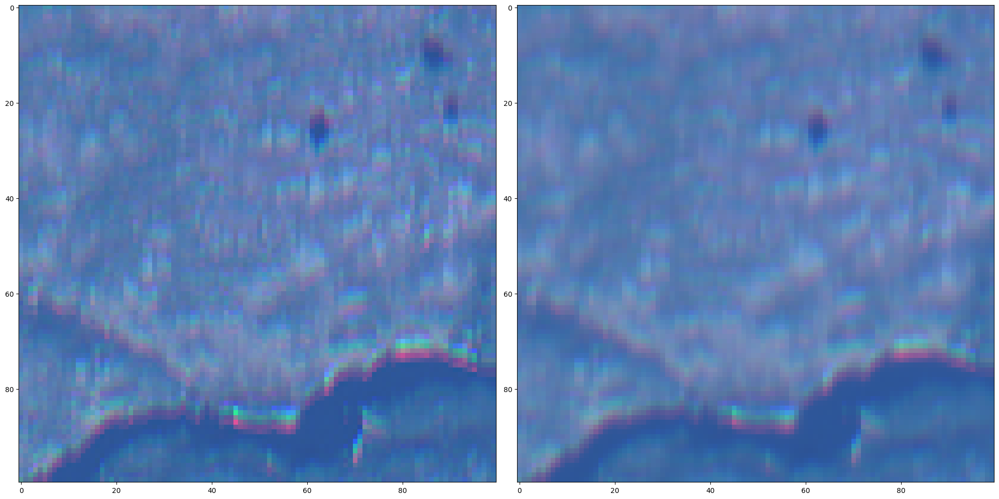

In [46]:
fig, axs = plt.subplots(figsize=(20, 10), ncols=2)
eop_res = eop.data["BANDS-RAD-HSI-MIS-SNR"][0][200:300, 200:300, [22, 12, 5]]
eop_snr = eop.data["BANDS-RAD-HSI-MIS-PSF"][0][200:300, 200:300, [22, 12, 5]]
axs[0].imshow(eop_res * VIZ_FACTOR / 100)
axs[1].imshow(eop_snr * VIZ_FACTOR / 100)
plt.tight_layout()

<a name="alternative"></a>
## 7: Alternative Noise and PSF filtering calculation

The `AlternativeHSICalculationTask` allows users to input their own Signal To Noise ratios and their own Point Spread Function kernel values for addition of SNR and PSF.

In [ ]:
psf_kernel = np.random.random(size=(7,7))/100. # random values between 0 and 0.01

snr_bands = [f"BAND_{cw}" for cw in np.arange(450, 950, 10)]
snr_values = { band: np.random.randint(20,80) for band in snr_bands }

snr_psf_task = AlternativeHSICalculationTask(
    input_feature=(FeatureType.DATA, "BANDS-RAD-HSI-MIS"),
    snr_feature=(FeatureType.DATA, "BANDS-RAD-HSI-MIS-SNR"),
    psf_feature=(FeatureType.DATA, "BANDS-RAD-HSI-MIS-PSF"),
    snr_values=snr_values,
    psf_kernel=psf_kernel,
    l_ref=100
)

# uncomment to run
# eop = snr_psf_task(eop)

# check result:
eop

<a name="l1c"></a>
## 8: Compute L1C 

If the specified processing level is L1C, reflectances are computed from radiances. Otherwise, radiances are provided as output for L1B.

In [47]:
reflectance_task = CalculateReflectanceTask(
    feature=(FeatureType.DATA, "BANDS-RAD-HSI-MIS-PSF", "HSI-BANDS"),
    processing_level=PROCESSING_LEVEL,
)

In [48]:
eop = reflectance_task(eop)

eop

EOPatch(
  data={
    BANDS-RAD-HSI-MIS: numpy.ndarray(shape=(1, 1024, 1024, 50), dtype=float64)
    BANDS-RAD-HSI-MIS-PSF: numpy.ndarray(shape=(1, 1024, 1024, 50), dtype=float64)
    BANDS-RAD-HSI-MIS-SNR: numpy.ndarray(shape=(1, 1024, 1024, 50), dtype=float64)
    HSI-BANDS: numpy.ndarray(shape=(1, 1024, 1024, 50), dtype=float64)
    sunZenithAngles: numpy.ndarray(shape=(1, 1024, 1024, 1), dtype=float32)
  }
  mask={
    dataMask: numpy.ndarray(shape=(1, 1024, 1024, 1), dtype=bool)
  }
  scalar={
    earth_sun_dist: numpy.ndarray(shape=(1, 1), dtype=float64)
    sol_irr_B01: numpy.ndarray(shape=(1, 1), dtype=float64)
    sol_irr_B02: numpy.ndarray(shape=(1, 1), dtype=float64)
    sol_irr_B03: numpy.ndarray(shape=(1, 1), dtype=float64)
    sol_irr_B04: numpy.ndarray(shape=(1, 1), dtype=float64)
    sol_irr_B05: numpy.ndarray(shape=(1, 1), dtype=float64)
    sol_irr_B06: numpy.ndarray(shape=(1, 1), dtype=float64)
    sol_irr_B07: numpy.ndarray(shape=(1, 1), dtype=float64)
    sol_irr_B

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


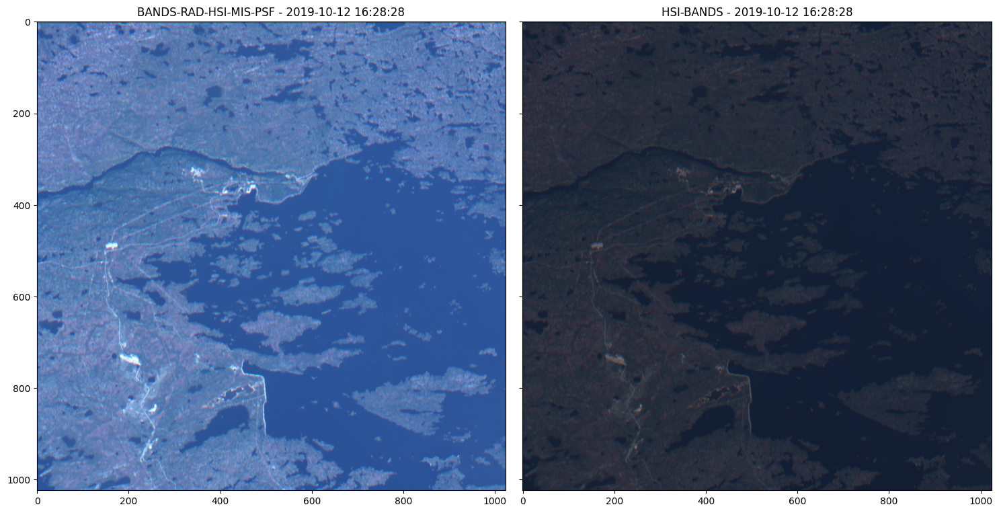

In [49]:
# plot differences due to noise
tidx = 0
viz_factor = (
    VIZ_FACTOR
    if PROCESSING_LEVEL.value == ProcessingLevels.L1C.value
    else VIZ_FACTOR / 100.0
)
_, axes = plt.subplots(ncols=2, nrows=1, figsize=(15, 15), sharex=True, sharey=True)

axes[0].imshow(
    eop.data["BANDS-RAD-HSI-MIS-PSF"][t_idx][..., [22, 12, 5]] * VIZ_FACTOR / 100.0
)
axes[0].set_title(f"BANDS-RAD-HSI-MIS-PSF - {eop.timestamp[tidx]}")
axes[1].imshow(eop.data["HSI-BANDS"][t_idx][..., [22, 12, 5]] * viz_factor)
axes[1].set_title(f"HSI-BANDS - {eop.timestamp[tidx]}")
plt.tight_layout()

Utility tasks to convert `dataMask` to uint8 to be exported into tiff, and removal of unused features to release memory.

In [50]:
# covert dataMask to uint8
casting_task = MapFeatureTask(
    (FeatureType.MASK, "dataMask"), (FeatureType.MASK, "dataMask"), np.uint8
)

In [51]:
eop = casting_task(eop)

In [52]:
remove_feature_task2 = RemoveFeatureTask(
    [
        (FeatureType.DATA, "BANDS-RAD-HSI-MIS"),
        (FeatureType.DATA, "BANDS-RAD-HSI-MIS-SNR"),
        (FeatureType.DATA, "BANDS-RAD-HSI-MIS-PSF"),
    ]
)

In [53]:
eop = remove_feature_task2(eop)

eop

EOPatch(
  data={
    HSI-BANDS: numpy.ndarray(shape=(1, 1024, 1024, 50), dtype=float64)
    sunZenithAngles: numpy.ndarray(shape=(1, 1024, 1024, 1), dtype=float32)
  }
  mask={
    dataMask: numpy.ndarray(shape=(1, 1024, 1024, 1), dtype=uint8)
  }
  scalar={
    earth_sun_dist: numpy.ndarray(shape=(1, 1), dtype=float64)
    sol_irr_B01: numpy.ndarray(shape=(1, 1), dtype=float64)
    sol_irr_B02: numpy.ndarray(shape=(1, 1), dtype=float64)
    sol_irr_B03: numpy.ndarray(shape=(1, 1), dtype=float64)
    sol_irr_B04: numpy.ndarray(shape=(1, 1), dtype=float64)
    sol_irr_B05: numpy.ndarray(shape=(1, 1), dtype=float64)
    sol_irr_B06: numpy.ndarray(shape=(1, 1), dtype=float64)
    sol_irr_B07: numpy.ndarray(shape=(1, 1), dtype=float64)
    sol_irr_B08: numpy.ndarray(shape=(1, 1), dtype=float64)
    sol_irr_B09: numpy.ndarray(shape=(1, 1), dtype=float64)
    sol_irr_B8A: numpy.ndarray(shape=(1, 1), dtype=float64)
  }
  meta_info={
    Shifts: <class 'dict'>, length=1
    size_x: 1024
    s

<a name="gridding"></a>
## 9. Tiling 

For creation of the training dataset, non-overlapping image patches of size 256x256 are created. When testing your algorithm, the image patches should possibly overlap to remove edge artefacts. 

Change the parameters in the cell below to modify the size of the image patches and their overlap.

In [54]:
CELL_SIZE = 256
GRID_OVERLAP = 0.0

The gridding task works for a single timestamp at a time. If you needed to grid multiple timeframes, you need to have a task for each timeframe to grid and export to Tiff.

In [55]:
time_index = 0

FEATURE_NAMES = [
    (FeatureType.DATA, "HSI-BANDS"),
    (FeatureType.MASK, "dataMask"),
]

gridding_tasks = []

for feature_type, feature_name in FEATURE_NAMES:
    gridding_tasks.append(
        GriddingTask(
            (feature_type, feature_name),
            (feature_type, f"{feature_name}-GRID_{time_index}"),
            (FeatureType.VECTOR_TIMELESS, f"{feature_name}-GRID_{time_index}"),
            size=CELL_SIZE,
            overlap=GRID_OVERLAP,
            resolution=HSI_PIX_SIZE,
            time_index=time_index,
        )
    )

In [56]:
eop = gridding_tasks[0].execute(eop)

In [57]:
eop

EOPatch(
  data={
    HSI-BANDS: numpy.ndarray(shape=(1, 1024, 1024, 50), dtype=float64)
    HSI-BANDS-GRID_0: numpy.ndarray(shape=(16, 256, 256, 50), dtype=float64)
    sunZenithAngles: numpy.ndarray(shape=(1, 1024, 1024, 1), dtype=float32)
  }
  mask={
    dataMask: numpy.ndarray(shape=(1, 1024, 1024, 1), dtype=uint8)
  }
  scalar={
    earth_sun_dist: numpy.ndarray(shape=(1, 1), dtype=float64)
    sol_irr_B01: numpy.ndarray(shape=(1, 1), dtype=float64)
    sol_irr_B02: numpy.ndarray(shape=(1, 1), dtype=float64)
    sol_irr_B03: numpy.ndarray(shape=(1, 1), dtype=float64)
    sol_irr_B04: numpy.ndarray(shape=(1, 1), dtype=float64)
    sol_irr_B05: numpy.ndarray(shape=(1, 1), dtype=float64)
    sol_irr_B06: numpy.ndarray(shape=(1, 1), dtype=float64)
    sol_irr_B07: numpy.ndarray(shape=(1, 1), dtype=float64)
    sol_irr_B08: numpy.ndarray(shape=(1, 1), dtype=float64)
    sol_irr_B09: numpy.ndarray(shape=(1, 1), dtype=float64)
    sol_irr_B8A: numpy.ndarray(shape=(1, 1), dtype=float64)


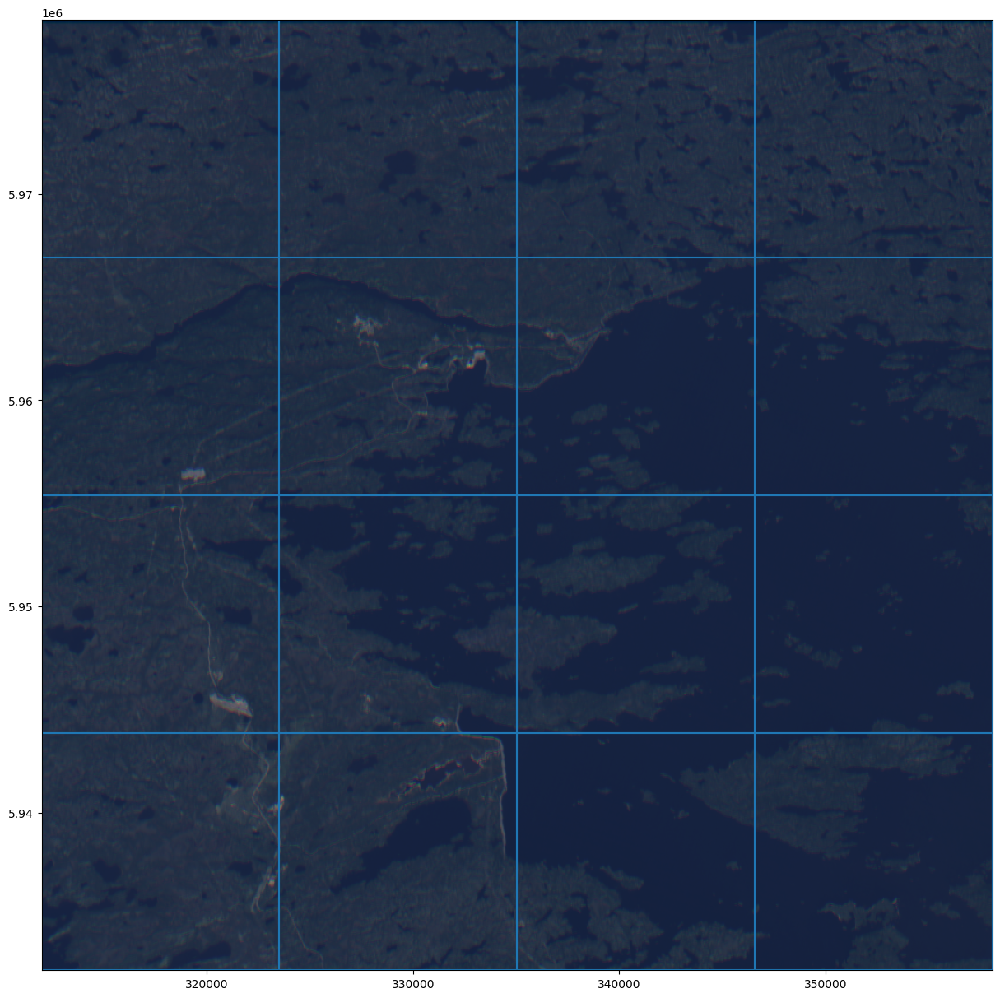

In [58]:
fig, axs = plt.subplots(figsize=(15, 15))
axs.imshow(
    viz_factor * eop.data["HSI-BANDS"][0][..., [18, 10, 1]],
    extent=get_extent(eop),
)
eop.vector_timeless[f"HSI-BANDS-GRID_{time_index}"].boundary.plot(ax=axs);

<a name="export"></a>
## 10. Export to Tiff 
 
Creates tiffs for a single timestamp. 

In [59]:
# create a folder for output tiffs
tiff_folder = "/home/ubuntu/hsi-s2_tiff_folder"
os.makedirs(tiff_folder, exist_ok=True)

In [60]:
export_tiff_tasks = []

for feature_type, feature_name in FEATURE_NAMES:
    export_tiff_tasks.append(
        ExportGridToTiff(
            data_stack_feature=(feature_type, f"{feature_name}-GRID_{time_index}"),
            grid_feature=(
                FeatureType.VECTOR_TIMELESS,
                f"{feature_name}-GRID_{time_index}",
            ),
            out_folder=tiff_folder,
            time_index=time_index,
        )
    )

In [61]:
eop = export_tiff_tasks[0].execute(eop)

<a name="workflow"></a>
## 11. Create workflow 

The above steps can be executed as an eo-learn workflov.

In [62]:
nodes = linearly_connect_tasks(
    input_task,
    add_meta_task,
    radiance_task,
    spectral_resample_task,
    misalignment_task,
    remove_feature_task1,
    snr_task,
    psf_filter_task,
    reflectance_task,
    casting_task,
    remove_feature_task2,
    *gridding_tasks,
    *export_tiff_tasks,
)
workflow = EOWorkflow(nodes)

In [63]:
workflow.dependency_graph()

In [ ]:
# This line repeats the simulation as done in the cells above
# results = workflow.execute({nodes[0]: {"bbox": bbox, "time_interval": time_interval}})

<a name="core-dataset"></a>
## 12. Core Dataset 

To get you started with your AI application at-the-edge, we simulated HSI imagery for around 490 location on Earth. 

The workflow as defined above was used to simulate L1C HSI products for the locations and dates as specified in the provided `hsi-s2-locations.gpkg` file. The code below was used to generate such images. 

The locations and acquisition times seek to match the ones for the PRISMA images utilized in the IMAGIN-e track of the challenge. The information about the time difference from the PRISMA acquisition time is stored in the GeoDataFrame, as well as the `maxcc` of Sentinel-2 image and the overlap between the HSI bounding box and the geometry of the Sentinel-2 image. The dataframe also contains the name of the coresponding PRISMA image `prisma_name`, in case you wanted to cross-reference the datasets.

We suggest you to prepare a similar dataframe with dates and locations suitable for your application and use the code below to simulate HSI imagery starting from Sentinel-2 L1C images. 

For the locations provided we suggest you download directly the pre-computed tiff files, unless you want to tweak the simulation workflow. The name of the zip archive containing the image patches can be found in the `zipfile` column, so you can retrieve from storage only the simulated locations of interest. The zipfiles are available on cloudferro on the following public bucket 

`https://s3.waw2-1.cloudferro.com/swift/v1/AUTH_afccea586afd4ef3bb11fe37dd1ddfbf/IMAGINe_Data/S2/`, 

and you can download any file by appending hte zip archive name, e.g. 

[`https://s3.waw2-1.cloudferro.com/swift/v1/AUTH_afccea586afd4ef3bb11fe37dd1ddfbf/IMAGINe_Data/S2/167900-9324410_32725_2021-05-25T12-53-38.zip`](https://s3.waw2-1.cloudferro.com/swift/v1/AUTH_afccea586afd4ef3bb11fe37dd1ddfbf/IMAGINe_Data/S2/167900-9324410_32725_2021-05-25T12-53-38.zip)

In [4]:
hsi_s2_locations = gpd.read_file("hsi-s2-locations.gpkg")

In [5]:
len(hsi_s2_locations)

488

In [6]:
WORLD_GDF = gpd.read_file(gpd.datasets.get_path("naturalearth_lowres"))

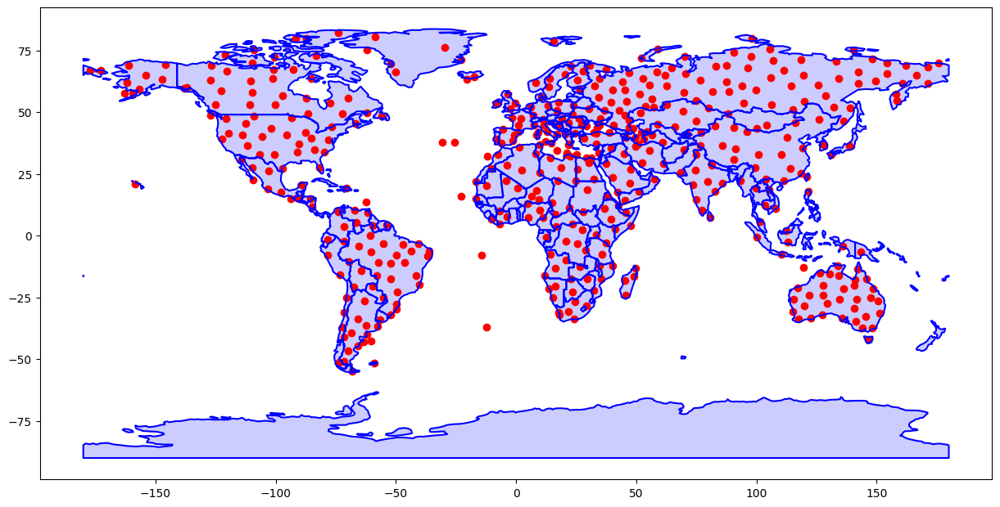

In [7]:
fig, ax = plt.subplots(figsize=(15, 10))
WORLD_GDF.plot(ax=ax, color="b", alpha=0.2)
WORLD_GDF.boundary.plot(ax=ax, color="b")
hsi_s2_locations.plot(ax=ax, color="r");

In [8]:
hsi_s2_locations.head(5)

,datetime_s2,intersection_ratio,cloud_cover_s2,time_difference,prisma_name,zipfile,geometry
0,2019-10-12T16:28:28,1.000000,0.30,-14,PRS_L1_STD_OFFL_20191026162600_20191026162604_...,335040-5955400_32618_2019-10-12T16-28-28.zip,POINT (-77.50000 53.72120)
1,2019-11-30T15:30:28,1.000000,16.20,-7,PRS_L1_STD_OFFL_20191207152456_20191207152500_...,632700-1080910_32618_2019-11-30T15-30-13.zip,POINT (-73.79000 9.77629)
2,2019-12-18T08:48:42,1.000000,28.67,-1,PRS_L1_STD_OFFL_20191219085427_20191219085431_...,539510-4571900_32636_2019-12-18T08-48-28.zip,POINT (33.47200 41.29760)
3,2019-12-20T09:31:05,0.805958,3.45,-1,PRS_L1_STD_OFFL_20191221093011_20191221093015_...,495240-3696340_32634_2019-12-20T09-31-01.zip,POINT (20.94890 33.40640)
4,2019-12-26T09:50:55,1.000000,0.23,4,PRS_L1_STD_OFFL_20191222094637_20191222094641_...,688270-3825460_32633_2019-12-26T09-50-50.zip,POINT (17.05200 34.55370)


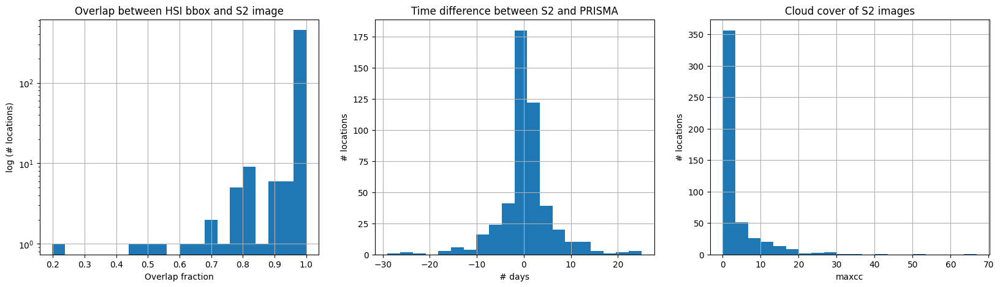

In [9]:
fig, ax = plt.subplots(figsize=(20, 5), ncols=3)
hsi_s2_locations.intersection_ratio.hist(ax=ax[0], bins=20, log=True)
ax[0].set_title("Overlap between HSI bbox and S2 image")
ax[0].set_xlabel("Overlap fraction")
ax[0].set_ylabel("log (# locations)")

hsi_s2_locations.time_difference.hist(ax=ax[1], bins=20)
ax[1].set_title("Time difference between S2 and PRISMA")
ax[1].set_xlabel("# days")
ax[1].set_ylabel("# locations")

hsi_s2_locations.cloud_cover_s2.hist(ax=ax[2], bins=20)
ax[2].set_title("Cloud cover of S2 images")
ax[2].set_xlabel("maxcc")
ax[2].set_ylabel("# locations");

The simulation workflow can be parallelized over the locations to speed up the processing. `EOExecutor` allows to scale the processing over multiple processors/instances. For this to work we need to prepare the list of arguments for the executor, and the number of processing units to parallelize the execution over.

In [70]:
exec_args = [
    {
        nodes[0]: {
            "bbox": get_utm_bbox(coords.y, coords.x),
            "time_interval": (atime.split("T")[0], atime.split("T")[0]),
        }
    }
    for atime, coords in zip(hsi_s2_locations.datetime_s2, hsi_s2_locations.geometry)
]

In [71]:
exec_args[0]

{EONode(task=<eolearn.io.sentinelhub_process.SentinelHubInputTask object at 0x7ff3b746d1c0>, inputs=(), name='SentinelHubInputTask'): {'bbox': BBox(((312000.0, 5932360.0), (358080.0, 5978440.0)), crs=CRS('32618')),
  'time_interval': ('2019-10-12', '2019-10-12')}}

In [ ]:
eoexecutor = EOExecutor(workflow=workflow, execution_kwargs=exec_args, save_logs=True)

In [ ]:
eoexecutor.run(workers=10);

In [ ]:
eoexecutor.make_report()